In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
from google.colab import files
uploading=files.upload()

Saving allFiles.csv to allFiles.csv


In [ ]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df=pd.read_csv('allFiles.csv',index_col=0)

In [ ]:
#df=df[:400000]

## EDA

In [ ]:
df.head()

,fx,fy,fz,mx,my,mz,Trial Number,Trial Type,Subject Number,Body Mass (Kg),AP Sway (cm),ML Sway (cm)
0,-6.47778,-11.10205,778.78125,-0.38182,-16.04395,-22.75000,1,1,Subject 001,79.2834,0.049028,-2.060136
1,-6.91699,-10.65332,777.71875,0.03605,-15.95557,-22.76465,1,1,Subject 001,79.2834,-0.004635,-2.051586
2,-6.55713,-11.10156,778.78125,-0.20785,-15.94238,-22.77148,1,1,Subject 001,79.2834,0.026689,-2.047093
3,-6.64404,-10.92285,778.40625,-0.30165,-15.87402,-22.70313,1,1,Subject 001,79.2834,0.038752,-2.039298
4,-6.74341,-10.64600,779.84375,-0.09583,-15.91504,-22.78906,1,1,Subject 001,79.2834,0.012288,-2.040799


In [ ]:
df.tail()

,fx,fy,fz,mx,my,mz,Trial Number,Trial Type,Subject Number,Body Mass (Kg),AP Sway (cm),ML Sway (cm)
14995,3.85071,-7.57349,626.18750,-13.28613,30.21777,-3.29358,36,6,Subject 008,61.623817,2.121749,4.825674
14996,3.67505,-7.21484,625.12500,-13.25586,30.31641,-3.33411,36,6,Subject 008,61.623817,2.120513,4.849656
14997,3.41003,-6.76709,625.84375,-13.22949,30.23730,-3.40369,36,6,Subject 008,61.623817,2.113865,4.831446
14998,3.05103,-7.47876,626.53125,-13.20020,30.25684,-3.31079,36,6,Subject 008,61.623817,2.106870,4.829263
14999,3.31970,-7.12305,625.50000,-13.30273,30.30273,-3.27930,36,6,Subject 008,61.623817,2.126735,4.844561


In [ ]:
df.sample(5)

,fx,fy,fz,mx,my,mz,Trial Number,Trial Type,Subject Number,Body Mass (Kg),AP Sway (cm),ML Sway (cm)
13347,-7.83765,-10.24561,791.71875,6.52124,-0.81161,-19.33398,19,1,Subject 001,79.283400,-0.823681,-0.102512
4899,-2.62964,-4.45581,786.15625,-3.81213,31.75586,-8.51221,16,4,Subject 003,72.505355,0.484907,4.039383
13386,0.14735,-7.71460,571.87500,9.97510,-13.05713,-9.95898,7,1,Subject 007,56.076363,-1.744280,-2.283214
2186,-7.97803,-10.50342,796.00000,-2.60474,4.69678,-19.92090,23,5,Subject 001,79.283400,0.327229,0.590048
5352,-2.58728,-6.48511,533.53125,30.89355,-4.84692,-9.59717,8,2,Subject 006,52.497061,-5.790392,-0.908460


In [ ]:
df.shape

(4141622, 12)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4141622 entries, 0 to 14999
Data columns (total 12 columns):
 #   Column          Dtype  
---  ------          -----  
 0   fx              float64
 1   fy              float64
 2   fz              float64
 3   mx              float64
 4   my              float64
 5   mz              float64
 6   Trial Number    int64  
 7   Trial Type      int64  
 8   Subject Number  object 
 9   Body Mass (Kg)  float64
 10  AP Sway (cm)    float64
 11  ML Sway (cm)    float64
dtypes: float64(9), int64(2), object(1)
memory usage: 410.8+ MB


In [ ]:
df.isnull().sum()

fx                0
fy                0
fz                0
mx                0
my                0
mz                0
Trial Number      0
Trial Type        0
Subject Number    0
Body Mass (Kg)    0
AP Sway (cm)      0
ML Sway (cm)      0
dtype: int64

In [ ]:
df.describe()

,fx,fy,fz,mx,my,mz,Trial Number,Trial Type,Body Mass (Kg),AP Sway (cm),ML Sway (cm)
count,4.141622e+06,4.141622e+06,4.141622e+06,4.141622e+06,4.141622e+06,4.141622e+06,4.141622e+06,4.141622e+06,4.141622e+06,4.141622e+06,4.141622e+06
mean,-1.618832e+00,-6.067932e+00,6.225338e+02,1.045832e+00,1.982484e-01,-9.915073e+00,1.856841e+01,3.497050e+00,6.066514e+01,-2.527847e-01,-1.130701e-02
std,6.444667e+00,5.163432e+00,1.048473e+02,1.459436e+01,1.016796e+01,4.304973e+00,1.043083e+01,1.710644e+00,1.004990e+01,2.333414e+00,1.663172e+00
min,-1.455781e+02,-9.714844e+01,2.827150e+00,-8.621094e+01,-1.003633e+02,-4.004688e+01,1.000000e+00,1.000000e+00,4.815877e+01,-1.178476e+01,-3.807063e+01
25%,-3.529790e+00,-9.593750e+00,5.490625e+02,-6.791260e+00,-6.246768e+00,-1.054639e+01,1.000000e+01,2.000000e+00,5.249706e+01,-1.759027e+00,-1.050991e+00
50%,-1.272030e+00,-5.771730e+00,5.980000e+02,2.470210e+00,3.567300e-01,-9.020510e+00,1.900000e+01,3.000000e+00,6.162382e+01,-4.092785e-01,5.898343e-02
75%,1.171750e+00,-2.755620e+00,6.537188e+02,1.052832e+01,6.556400e+00,-7.652100e+00,2.800000e+01,5.000000e+00,6.281340e+01,1.095831e+00,1.056186e+00
max,1.975547e+02,8.324219e+01,9.651562e+02,6.685938e+01,6.570703e+01,4.880620e+00,3.700000e+01,6.000000e+00,7.928340e+01,3.445227e+01,2.348549e+01


In [ ]:
df['Trial Type'].unique()

array([1, 2, 3, 4, 5, 6])

- With the unique() function, we can see the unique values in a feature. With the nunique() function, we can see the number of these unique values.

In [ ]:
df['Trial Number'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37])

In [ ]:
df['AP Sway (cm)'].describe()

count    4.141622e+06
mean    -2.527847e-01
std      2.333414e+00
min     -1.178476e+01
25%     -1.759027e+00
50%     -4.092785e-01
75%      1.095831e+00
max      3.445227e+01
Name: AP Sway (cm), dtype: float64

In [ ]:
df['ML Sway (cm)'].describe()

count    4.141622e+06
mean    -1.130701e-02
std      1.663172e+00
min     -3.807063e+01
25%     -1.050991e+00
50%      5.898343e-02
75%      1.056186e+00
max      2.348549e+01
Name: ML Sway (cm), dtype: float64

- The corr () function has a great importance in machine learning. After determining our target feature to predict, we look at the correlation of this feature with other features. And when training our model, we take features with a corelation of more than 20% and less than 90%. This is because features with a correlation value of less than 20% have little connection with target features and do not contribute much to predictions.
- Let me explain the reason why we get over 90% with an example: For example, we want to estimate the age of an individual, we cannot train the machine by the year of birth of the individual because we have already given the answer.

   - If the correlation is greater than 90%, it means that the data replicated itself in another form.

In [ ]:
abs(df.corr()['AP Sway (cm)'].sort_values(ascending=False))

AP Sway (cm)      1.000000
Trial Type        0.359294
Body Mass (Kg)    0.267757
fz                0.215750
mz                0.134368
my                0.024728
Trial Number      0.002883
ML Sway (cm)      0.000972
fx                0.007695
fy                0.157106
mx                0.966911
Name: AP Sway (cm), dtype: float64

In [ ]:
abs(df.corr()['ML Sway (cm)'].sort_values(ascending=False))

ML Sway (cm)      1.000000
my                0.944264
mz                0.294819
fz                0.154054
Body Mass (Kg)    0.108027
Trial Number      0.033759
AP Sway (cm)      0.000972
Trial Type        0.005355
mx                0.021619
fy                0.029860
fx                0.116864
Name: ML Sway (cm), dtype: float64

- The "Subject Number" feature is an object feature. Since we want to include it in this feature while training our model, we must make minor changes in this feature. Normally I can convert a feature with int or float values into an object feature, but I cannot convert a feature with an object (containing a string) to int directly with the astype (int) function. Therefore, we replace the "Subject 00" part, which is common in this feature with the replace () function, with nothing. Now we only have participant numbers 1 to 8 in our columns. Now we can convert this feature to an int value.

  - We can convert the Subject feature from object to int without using LabelEncoding. I'll also show you the use of LabelEncoding below.

In [ ]:
df['Subject Number'].replace({'Subject 00':''},regex=True,inplace=True)
df['Subject Number']=df['Subject Number'].astype(int);

In [ ]:
abs(df.corr()['Subject Number'].sort_values(ascending=False))

Subject Number    1.000000
mz                0.649267
fx                0.175830
ML Sway (cm)      0.070002
my                0.068177
fy                0.064284
mx                0.040048
Trial Type        0.004206
Trial Number      0.006049
AP Sway (cm)      0.036516
Body Mass (Kg)    0.488195
fz                0.526974
Name: Subject Number, dtype: float64

In [ ]:
abs(df.corr()['Trial Type'].sort_values(ascending=False))

Trial Type        1.000000
AP Sway (cm)      0.359294
Trial Number      0.154506
mz                0.060668
Body Mass (Kg)    0.005416
Subject Number    0.004206
my                0.000423
fz                0.000102
ML Sway (cm)      0.005355
fx                0.038929
fy                0.044938
mx                0.348358
Name: Trial Type, dtype: float64

In [ ]:
abs(df.corr()['Body Mass (Kg)'].sort_values(ascending=False))

Body Mass (Kg)    1.000000
fz                0.959601
AP Sway (cm)      0.267757
ML Sway (cm)      0.108027
my                0.101717
Trial Type        0.005416
Trial Number      0.004147
fx                0.215465
fy                0.235221
mx                0.254419
Subject Number    0.488195
mz                0.638235
Name: Body Mass (Kg), dtype: float64

## Pandas Profiling Report

- Thanks to Pandas profling, we can see aspects of data that we have never seen before.
 - We can see detailed examination of each feature, 4 different types of corelations, loss values and examples of different parts of the data and etc.

- Before using Pandas profing, you have to install it on your computer with (! Pip3 install pandas_profiling --upgrade).

In [ ]:
!pip3 install pandas_profiling --upgrade

In [ ]:
import pandas_profiling

df.profile_report()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Vizualization

- We see the corelation values of all features with each other. As the color gets lighter, the correlation between those two columns increases.
In addition, with annot = True, we can see the corelation values between features inside the boxes.

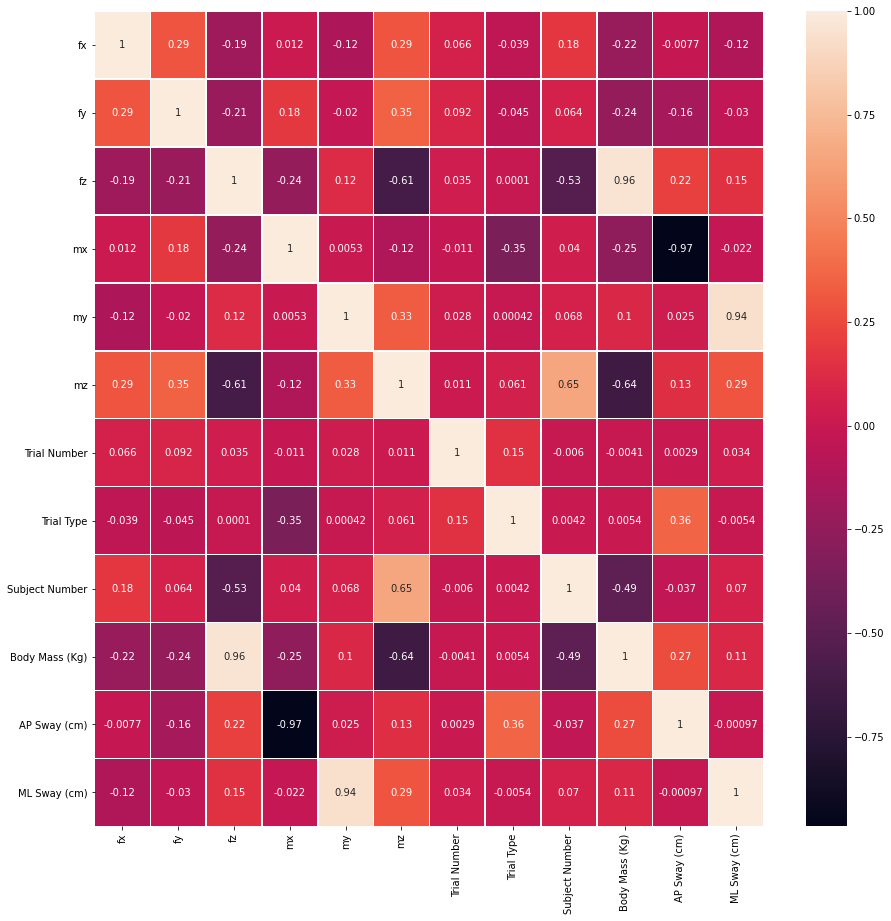

In [ ]:
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(df.corr(), annot=True, linewidths=.5, ax=ax);

-In this graph, we can see the weight distribution in all data. With hue = df ['Subject Number'], we add another dimension to the graph, so we can see the weight distributions of 8 different individuals participating in the experiment.
With plt.xticks (rotation = 45), we set the angle of the text on the x-axis of the chart to 45 degrees so that we can see the values more clearly.

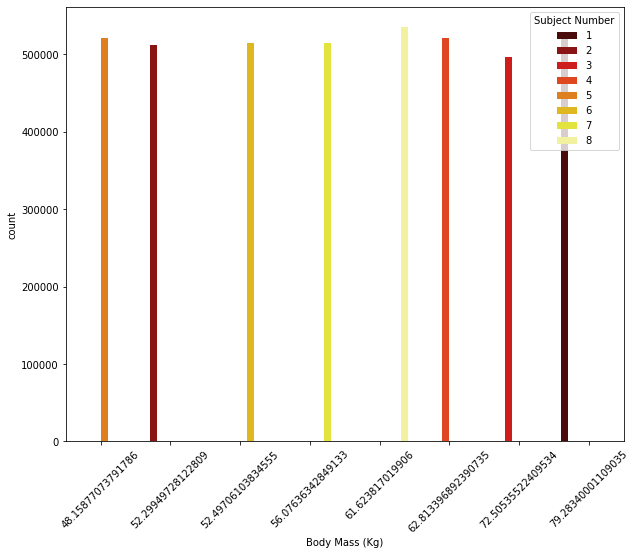

In [ ]:
plt.figure(figsize=(10,8))
sns.countplot(x=df['Body Mass (Kg)'],hue=df['Subject Number'],palette='hot')
plt.xticks(rotation=45);

- The purpose of using dist plot in data visualization is to see the distribution of data (such as linear or nonlinear). The purpose of using box plot is to see outlier data in the data. Because we need to clear this outlier data before doing machine learning.

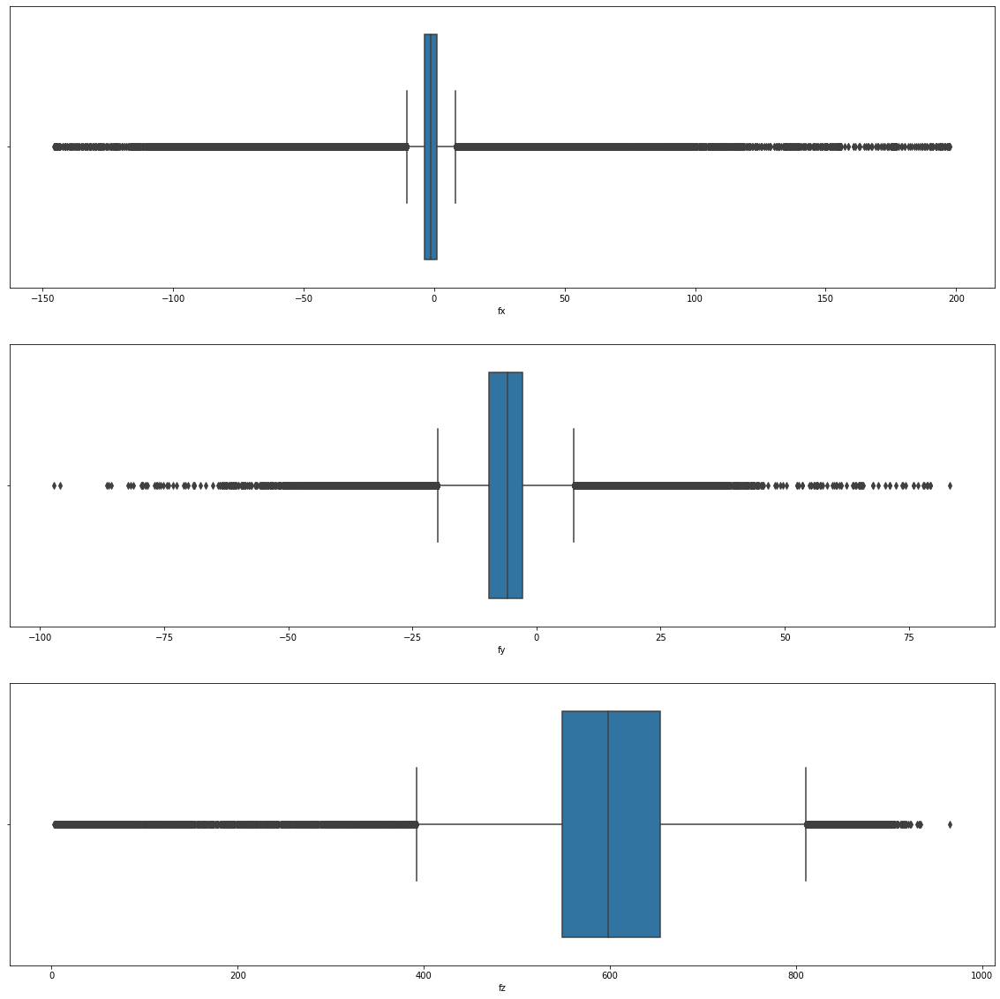

In [ ]:
fig=plt.figure(figsize=(20,20))
ax=fig.add_subplot(3,1,1)
ax=sns.boxplot(df['fx'])

bx=fig.add_subplot(3,1,2)
bx=sns.boxplot(df['fy'])

cx=fig.add_subplot(3,1,3)
cx=sns.boxplot(df['fz']);

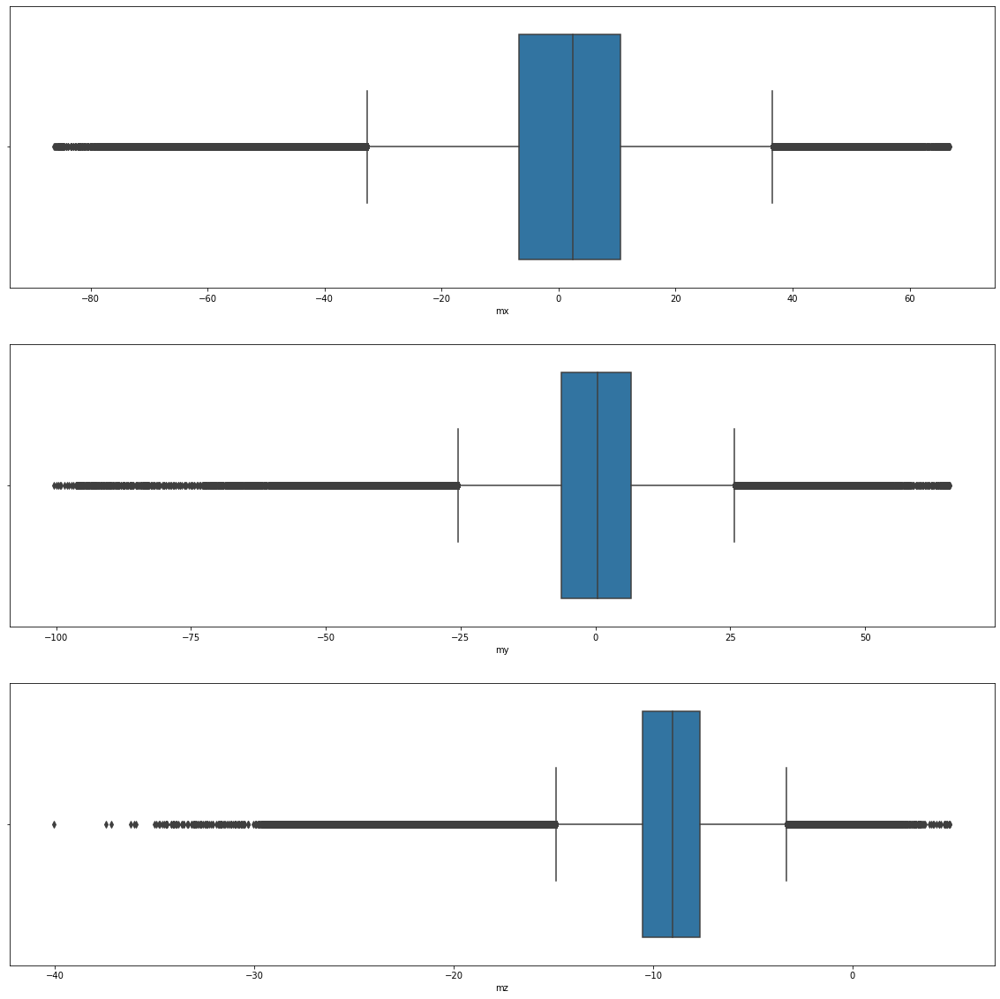

In [ ]:
fig=plt.figure(figsize=(20,20))
ax=fig.add_subplot(3,1,1)
ax=sns.boxplot(df['mx'])

bx=fig.add_subplot(3,1,2)
bx=sns.boxplot(df['my'])

cx=fig.add_subplot(3,1,3)
cx=sns.boxplot(df['mz']);

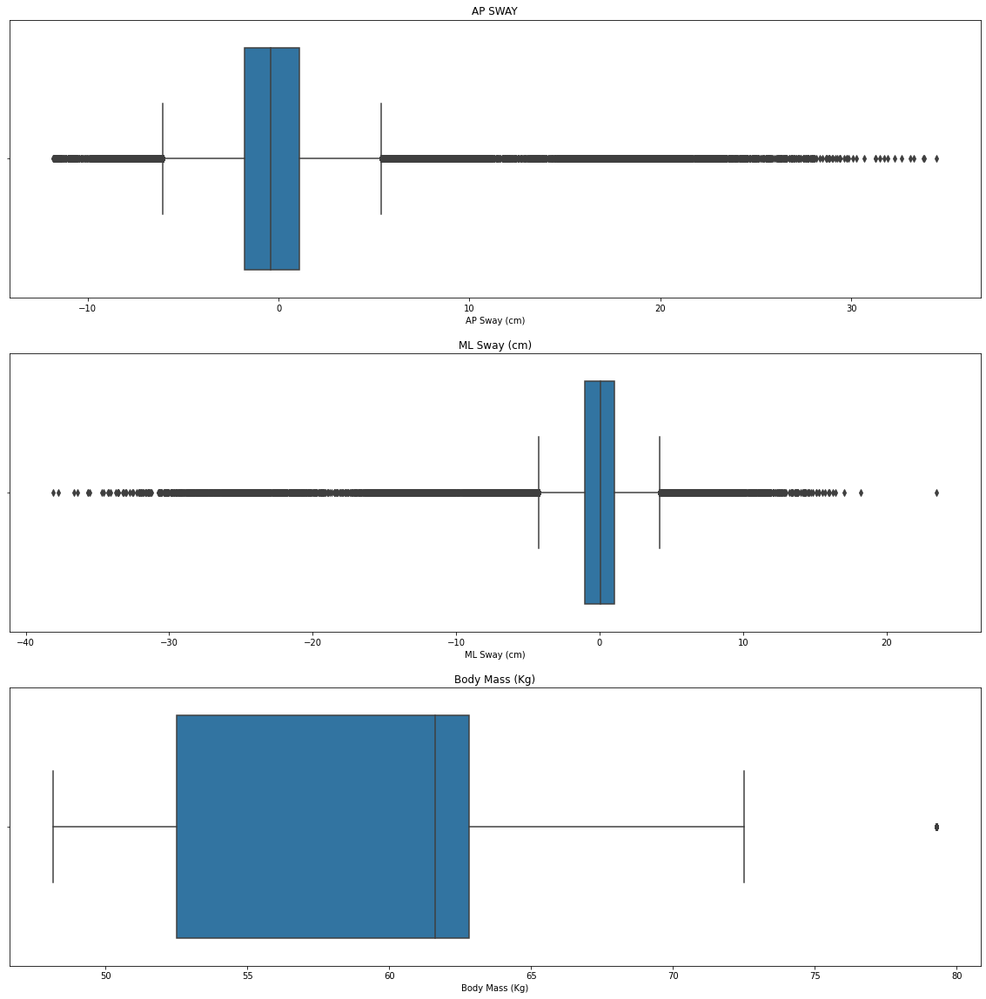

In [ ]:
fig=plt.figure(figsize=(20,20))

ax=fig.add_subplot(3,1,1)
ax=sns.boxplot(df['AP Sway (cm)'],hue=df['Subject Number'])
ax.set_title('AP SWAY')

bx=fig.add_subplot(3,1,2)
bx=sns.boxplot(df['ML Sway (cm)'],hue=df['Subject Number'])
bx.set_title('ML Sway (cm)')

cx=fig.add_subplot(3,1,3)
cx=sns.boxplot(df['Body Mass (Kg)'],hue=df['Subject Number'])
cx.set_title('Body Mass (Kg)');

- On the force plate, the sways of individuals under 6 different conditions are measured and we can clearly see the rate of using these measurements in the experiment with the pie chart.

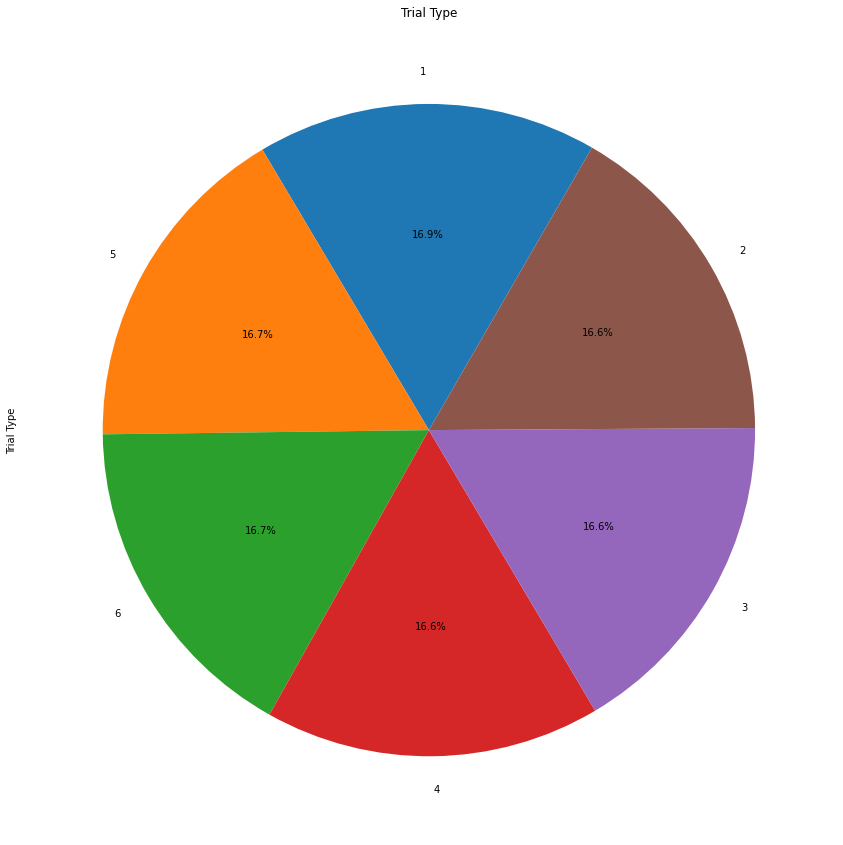

In [ ]:
plt.figure(figsize=(15,15))
df['Trial Type'].value_counts().plot.pie(autopct='%1.1f%%',startangle=60)
plt.title('Trial Type');

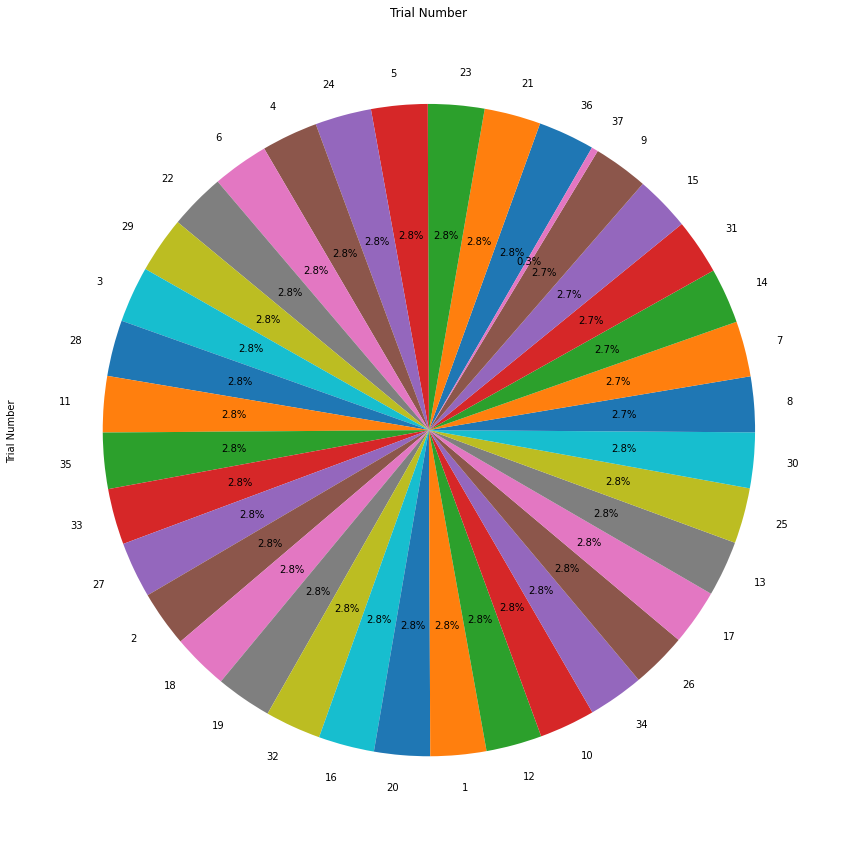

In [ ]:
plt.figure(figsize=(15,15))
df['Trial Number'].value_counts().plot.pie(autopct='%1.1f%%',startangle=60)
plt.title('Trial Number');

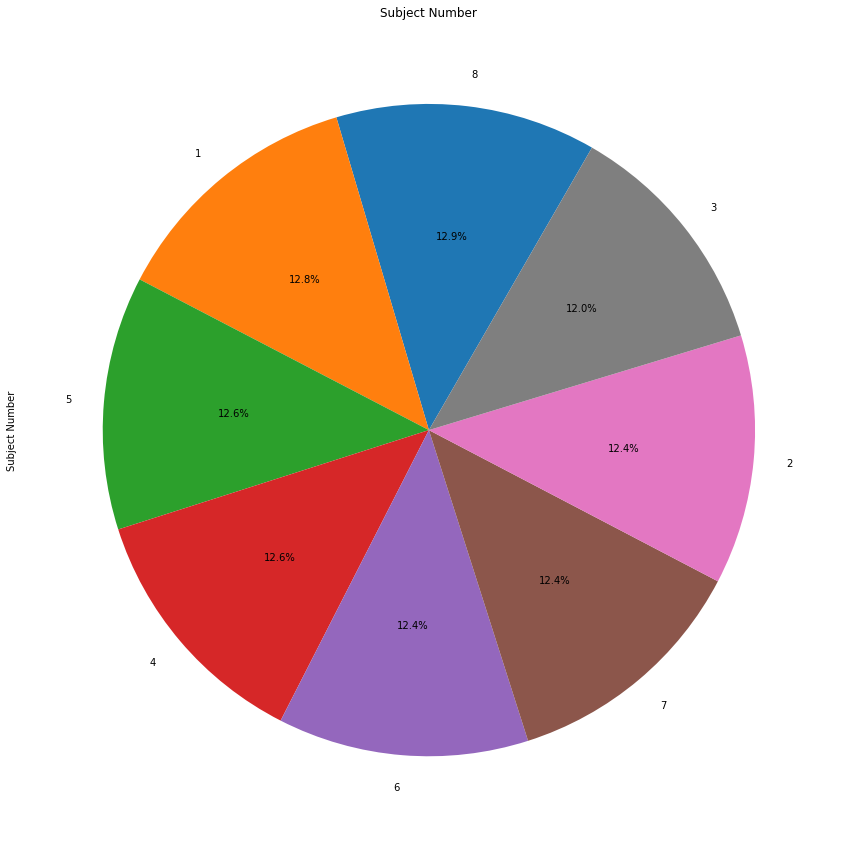

In [ ]:
plt.figure(figsize=(15,15))
df['Subject Number'].value_counts().plot.pie(autopct='%1.1f%%',startangle=60)
plt.title('Subject Number');

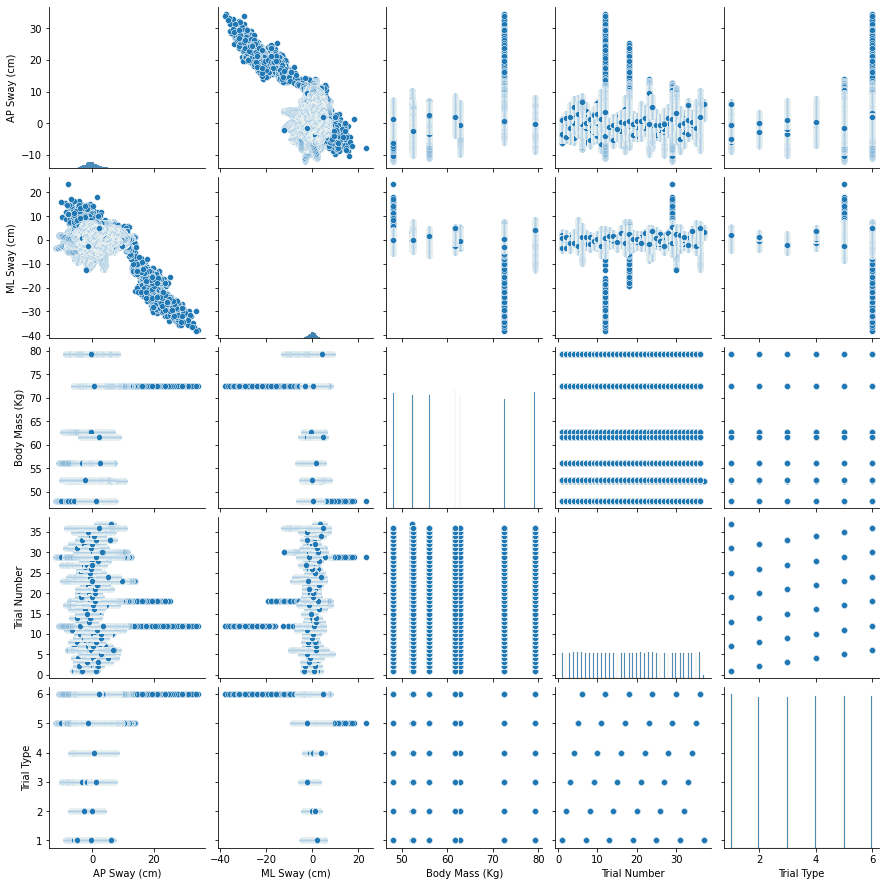

In [ ]:
sns.pairplot(df[['AP Sway (cm)','ML Sway (cm)','Body Mass (Kg)','Trial Number','Trial Type']]);

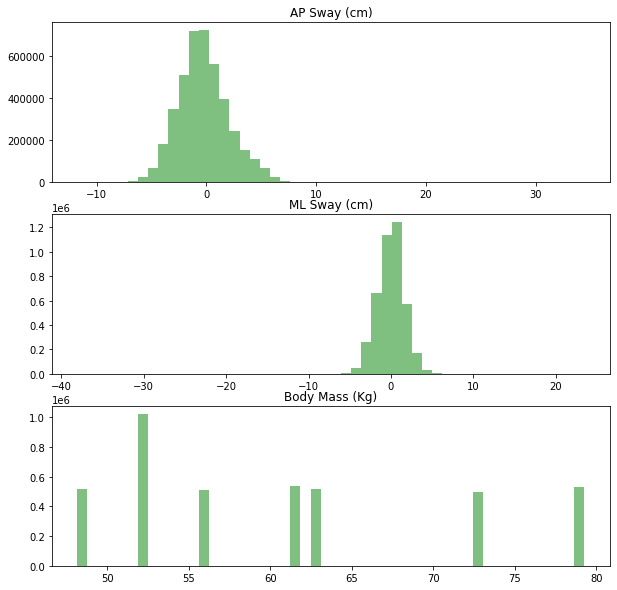

In [ ]:
fig=plt.figure(figsize=(10,10))
ax=fig.add_subplot(3,1,1)
ax.hist(df['AP Sway (cm)'],bins=50, facecolor='green',alpha=0.5)
ax.set_title('AP Sway (cm)')
bx=fig.add_subplot(3,1,2)
bx.hist(df['ML Sway (cm)'],bins=50, facecolor='green', alpha=0.5)
bx.set_title('ML Sway (cm)')
cx=fig.add_subplot(3,1,3)
cx.hist(df['Body Mass (Kg)'],bins=50, facecolor='green', alpha=0.5)
cx.set_title('Body Mass (Kg)');

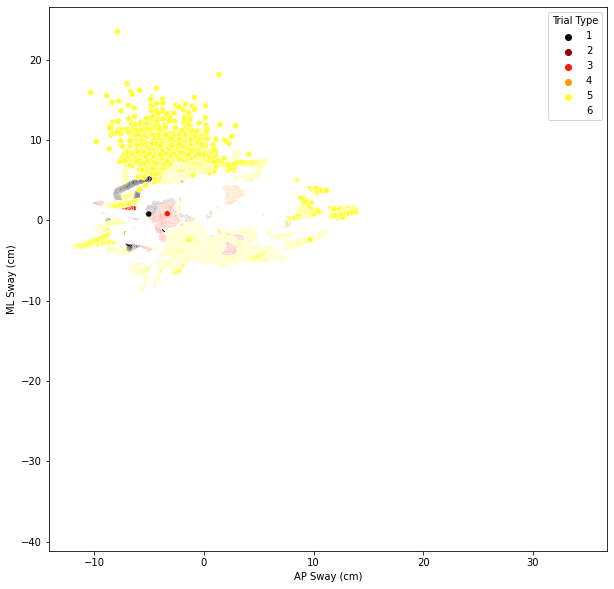

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(x='AP Sway (cm)',y='ML Sway (cm)',hue='Trial Type',data=df,palette='hot')
plt.show();

## Normalize the Data

- Normalization is a technique often applied as part of data preparation for machine learning. The goal of normalization is to change the values of numeric features in the dataset to a common scale, without distorting differences in the ranges of values.

In [ ]:
def normalize_(x):
  from sklearn.preprocessing import MinMaxScaler
  scaler=MinMaxScaler()
  return scaler.fit_transform(x)


- The difference of regression and classification:
In regression, we estimate the number, but in classification, we predict the questions that have a yes-no result. (In multinominal classification, the result may be more than 2 options.)
- Therefore, we will use regression models to estimate AP and ML sway values. We use classification models to predict the athlete and what type of diving.
If the data is more than 3 thousand, we can use deep learning, so we can get better results. Since our current data consists of 4 million lines, we will also use deep learning.


## Regression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge,Lasso
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import ExtraTreeRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

- I have included our models for Regression. I want to measure my success rate and error rate in more than one model and I don't want to write these codes separately for each model. For this reason, I am writing a regression function, after that I will determine my goal and the columns I will train, send it to the function and see the results in a table.

In [ ]:
def algo_test(x,y):

        #I include the regression models I will use.
        L=LinearRegression()
        R=Ridge()
        Lass=Lasso()
        E=ElasticNet()
        ETR=ExtraTreeRegressor()
        GBR=GradientBoostingRegressor()
        XGBC=XGBRegressor()
        dt=DecisionTreeRegressor()
        kn=KNeighborsRegressor()

        #I separate the data as train and test. (20% test)
        x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.2,random_state=42)

        #I put my models and model names in a list.
        algos=[L,R,Lass,E,ETR,GBR,XGBC,dt,kn]
        algo_names=['Linear','Ridge','Lasso','ElasticNet','Extra Tree','Gradient Boosting','XGradientBoosting','DecisionTree','KNeighbors']

        #I create empty lists for error rates and success rates, which I will fill in later.
        r2Score = []
        rmse = []
        mae = []

        #I am creating a dataframe as I want to see all results as a table.
        #Its columns will be 'R2_score', 'RMSE', 'MAE'. The indexes will take from the string I created for the model names.
        result=pd.DataFrame(columns=['R2_score','RMSE','MAE'],index=algo_names)

        #I run the regression algorithms for each model and find the results of r2_score, mean_absolute_error and mean_squared_error.
        #And I add these results I found to the empty lists I created above with the append () function.
        for algo in algos:
            p=algo.fit(x_train,y_train).predict(x_test)
            r2Score.append(r2_score(y_test,p))
            rmse.append(mean_squared_error(y_test,p)**.5)
            mae.append(mean_absolute_error(y_test,p))

        #I fill the columns in the table with these lists.
        result['R2_score']=r2Score
        result.RMSE=rmse
        result.MAE=mae

        #I sort my result table by r2_score value and return it.
        return result.sort_values('R2_score',ascending=False)



In [ ]:
df.sample(5)

,fx,fy,fz,mx,my,mz,Trial Number,Trial Type,Subject Number,Body Mass (Kg),AP Sway (cm),ML Sway (cm)
2029,-5.63696,-10.12744,777.37500,-3.76953,-11.71631,-21.52539,2,2,1,79.283400,0.484905,-1.507163
12358,-4.18677,-8.00293,496.01563,2.67285,-10.31836,-9.90381,17,5,5,48.158771,-0.538864,-2.080249
82,-10.47607,-5.76074,780.93750,-23.30371,-16.53906,-19.67285,3,3,1,79.283400,2.984069,-2.117847
6992,0.81354,-5.01855,504.76563,-9.07129,4.46216,-7.35498,12,6,5,48.158771,1.797129,0.884006
10832,-1.21808,-5.42065,554.15625,6.98145,3.46460,-7.66089,4,4,2,52.299497,-1.259834,0.625203


- We predict the AP sway values by giving the force plate measurements of the athletes. And we can make this prediction with the KNeighbors model with a success rate of 0.993920.

- Y is always given the target feature, and this feature from x is dropped with the drop () function.

In [ ]:
y=df['AP Sway (cm)']
x=df.drop(columns=['AP Sway (cm)','mx'],axis=1)

In [ ]:
x=pd.get_dummies(x,drop_first=True)

- While specifying x, we drop the target feature and mx feature because corr is above 90%.

- Before sending x and y to the algo_test function, we normalize x with the normalize function. This process increases the success rate. (We do not normalize the target feature.)

In [ ]:
x=normalize_(x)

In [ ]:
algo_test(x,y)

,R2_score,RMSE,MAE
KNeighbors,0.993920,0.181741,0.086295
Extra Tree,0.978061,0.345217,0.155069
DecisionTree,0.977649,0.348446,0.148874
XGradientBoosting,0.927642,0.626944,0.456992
Gradient Boosting,0.751565,1.161692,0.898013
Linear,0.507610,1.635458,1.264625
Ridge,0.507608,1.635461,1.264665
Lasso,-0.000009,2.330702,1.794591
ElasticNet,-0.000009,2.330702,1.794591


- We predict the ML sway values by giving the force plate measurements of the athletes.

In [ ]:
y=df['ML Sway (cm)']
x=df.drop(columns=['ML Sway (cm)','my'],axis=1)

In [ ]:
x=pd.get_dummies(x,drop_first=True)

In [ ]:
x=normalize_(x)

In [ ]:
algo_test(x,y)

,R2_score,RMSE,MAE
KNeighbors,9.943916e-01,0.124316,0.053447
Extra Tree,9.756195e-01,0.259195,0.105745
DecisionTree,9.731581e-01,0.271965,0.104258
XGradientBoosting,9.206857e-01,0.467500,0.309166
Gradient Boosting,7.729252e-01,0.791025,0.561445
Ridge,4.260412e-01,1.257611,0.942964
Linear,4.260342e-01,1.257618,0.943011
Lasso,-2.423055e-10,1.659991,1.267697
ElasticNet,-2.423055e-10,1.659991,1.267697


## Deep Learning

- I will use Deep Learning, one of the newest technologies of recent times, to predict ML Sway.

- We want to estimate the ML sway values by giving the force plate measurements of the athletes, but when we remove the features where corr is more than 90%, our success rate decreases, so we will try to increase the accuracy of our predictions by applying deep learning.

In [ ]:
y=df[['ML Sway (cm)']]
x=df.drop(columns=['ML Sway (cm)','my'],axis=1)

In [ ]:
x=pd.get_dummies(x,drop_first=True)

In [ ]:
x=normalize_(x)

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=42)

- Ways to increase success in Deep Learning:
  - The number of nodes in the layers can be increased
  - The number of layers can be increased
  - Dropout can be used (Dropout prevents it from memorizing the data, discards some of the data)
  - BatchNormalize () can be used (We normalize the data with BatchNormalization () after each layer.)

- If we were classifying with deep learning, the last layer would also have activation = 'sigmoid', loss = 'sparse_categorical_crossentropy' or loss = 'binary_crossentropy' and metrics = ['accuracy'].

In [ ]:
!pip install tensorflow

In [ ]:
import tensorflow as tf
model = tf.keras.Sequential([
                             tf.keras.layers.Dense(512, activation='relu'),
                             tf.keras.layers.Dense(512, activation='relu'),
                             tf.keras.layers.Dropout(0.25),
                             tf.keras.layers.Flatten(),
                             tf.keras.layers.Dense(512, activation='relu'),
                             tf.keras.layers.Dropout(0.50),
                             tf.keras.layers.Dense(512, activation='relu'),
                             tf.keras.layers.Dense(512, activation='softmax'),])

model.compile(optimizer='adam', loss='mse')
history = model.fit(x_train,y_train, batch_size=128, epochs=40, verbose=1, validation_data=(x_test,y_test))

Epoch 1/40
24268/24268 [==============================] - 744s 31ms/step - loss: 2.7651 - val_loss: 2.7604
Epoch 2/40
24268/24268 [==============================] - 732s 30ms/step - loss: 2.7654 - val_loss: 2.7604
Epoch 3/40
24268/24268 [==============================] - 726s 30ms/step - loss: 2.7701 - val_loss: 2.7604
Epoch 4/40
24268/24268 [==============================] - 721s 30ms/step - loss: 2.7854 - val_loss: 2.7604
Epoch 5/40
24268/24268 [==============================] - 725s 30ms/step - loss: 2.7524 - val_loss: 2.7604
Epoch 6/40
24268/24268 [==============================] - 725s 30ms/step - loss: 2.7738 - val_loss: 2.7604
Epoch 7/40
24268/24268 [==============================] - ETA: 0s - loss: 2.7658

In [ ]:
model.summary()

In [ ]:
loss_df=pd.DataFrame(model.history.history)
loss_df.plot(figsize=(12,8));

In [ ]:
pred=history.predict(x_test)

In [ ]:
mean_squared_error(y_test,pred)**.5

In [ ]:
r2_score(y_test,pred)

## Classification

- In ML models we are often required to convert the categorical i.e text features to its numeric representation. The two most common ways to do this is to use Label Encoder or OneHot Encoder.

- With the Unique () function, we see the initial version of the "Subject Number" column in the object state and after the LabelEncoding is applied.

In [ ]:
df['Subject Number'].unique()

array(['Subject 001', 'Subject 002', 'Subject 003', 'Subject 004',
       'Subject 005', 'Subject 006', 'Subject 007', 'Subject 008'],
      dtype=object)

In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df['Subject Number']=le.fit_transform(df['Subject Number'])

In [ ]:
df['Subject Number'].unique()

array([0, 1, 2, 3, 4, 5, 6, 7])

In [ ]:
#If I were waiting for my prediction result with 2 options as yes or no with Classification,
#I would use both of these models, but here I will guess which of the 8 different answers.

#from sklearn.naive_bayes import GaussianNB
#from sklearn.naive_bayes import BernoulliNB

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import MultinomialNB

from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
from sklearn.metrics import confusion_matrix,classification_report

In [ ]:
def classification_(x,y):


    #g=GaussianNB()
    #b=BernoulliNB()
    k=KNeighborsClassifier()
    svc=SVC()
    d=DecisionTreeClassifier()
    log=LogisticRegression()
    gbc=GradientBoostingClassifier()
    mn=MultinomialNB()
    rf=RandomForestClassifier()
    ab=AdaBoostClassifier()

    algos=[k,svc,d,log,gbc,mn,rf,ab]
    algos_name=['KNeigbors','SVC','DecisionTree','LogisticRegr','GradientBoosting','Multinominal','RandomForest','AdaBoost']

    accuracy = []
    precision = []
    recall = []
    f1 = []

    result=pd.DataFrame(columns=['AccuracyScore','PrecisionScore','RecallScore','f1_Score'],index=algos_name)

    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=42)

    for i in algos:

        predict=i.fit(x_train,y_train).predict(x_test)

        accuracy.append(accuracy_score(y_test,predict))
        precision.append(precision_score(y_test,predict,average='weighted'))
        recall.append(recall_score(y_test,predict,average='weighted'))
        f1.append(f1_score(y_test,predict,average='weighted'))

    result.AccuracyScore=accuracy
    result.PrecisionScore=precision
    result.RecallScore=recall
    result.f1_Score=f1


    return result.sort_values('f1_Score',ascending=False)



- Based on the force plate data, we will predict which swimmer this data belongs to.

In [ ]:
y=df['Subject Number']
x=df.drop('Subject Number',axis=1)

In [ ]:
classification_(x,y)

- Given the sways of the athletes, we will predict which of the 8 types of movement they do with classification.

In [ ]:
y=df['Trial Type']
x=df.drop('Trial Type',axis=1)

In [ ]:
classification_(x,y)

## Clustering

- By clustering, we can divide the swimmers participating in the experiment into groups with the elbow method.

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
def cluster(x,clusters):

    x=x
    allscore = []
    allclusters = []
    sum_of_squared_distances = []

    for i in np.arange(1,clusters):

        i+=1
        model=KMeans(n_clusters=i)
        pred=model.fit_predict(x)
        s_score=silhouette_score(x,pred)
        print('Number of cluster: {} , Score: {}'.format(i,s_score))
        allscore.append(s_score)
        allclusters.append(i)
        sum_of_squared_distances.append(model.inertia_)

    plt.figure(figsize=(10,10))
    plt.plot(allclusters,sum_of_squared_distances,marker='x',c='r');


- I choose those features according to which characteristics I want to group the athletes.

In [ ]:
data=df[['AP Sway (cm)','ML Sway (cm)','Body Mass (Kg)','fx','fy','fx','mx','my','mz','Trial Type','Trial Number']]

In [ ]:
cluster(data,10)

In [ ]:
model=KMeans(n_clusters=4)
pred=model.fit_predict(data)
silhouette_score(data,pred)

In [ ]:
data['Cluster']=pred

In [ ]:
data.sample(10)

- With pycaret clustering, we don't need to write the function above. pycaret makes the most appropriate grouping according to the elbow method.

In [ ]:
!pip install pycaret

In [ ]:
from pycaret.clustering import *
clul=setup(data,session_id=123,log_experiment=True,log_plots=True)

In [ ]:
kmeans=create_model('kmeans',num_clusters=4)

In [ ]:
plot_model(kmeans)

In [ ]:
plot_model(kmeans,plot='elbow')

In [ ]:
plot_model(kmeans,feature='AP Sway (cm)',label=True)

In [ ]:
plot_model(kmeans,feature='ML Sway (cm)',label=True)

In [ ]:
plot_model(kmeans,plot='tsne')